Renaming data files from device number to device name

In [6]:
import csv
import os

# Define input and output directories
input_dir = "C:/Users/67246/Documents/GitHub/CS506Private/Project/Data/Processed/Combined_devices_without_breaks"
output_dir = "C:/Users/67246/Documents/GitHub/CS506Private/Project/Data/Processed/Combined Device Without Breaks"

# Read device name and number information from separate CSV file
device_info_file = "C:/Users/67246/Documents/GitHub/CS506Private/Project/Data/Processed/Device Geo Locations.csv"
device_info = {}
with open(device_info_file, "r") as f:
    reader = csv.DictReader(f)
    for row in reader:
        device_info[row["Device No."]] = row["Device"]

# Loop through input files
for filename in os.listdir(input_dir):
    if filename.endswith(".csv"):
        # Extract device number from filename
        device_number = filename.split("_")[1]
        # Look up device name from device_info dictionary
        device_name = device_info.get(device_number, device_number)
        # Construct output filename using device name
        output_filename = device_name + "_sorted_by_date_only_breaks.csv"
        # Rename input file to output file
        os.rename(os.path.join(input_dir, filename), os.path.join(output_dir, output_filename))


Origin path

New Path

In [20]:
import csv
import os
from datetime import datetime
from statistics import median

# Define input and output directories
input_dir = dir_withoutB
output_dir = sum_withoutB

# Define date format
date_format = "%Y-%m-%d %H:%M:%S"

# Loop through input files
for filename in os.listdir(input_dir):
    if filename.endswith(".csv"):
        # Construct input and output file paths
        input_file = os.path.join(input_dir, filename)
        output_file = os.path.join(output_dir, filename[:-4] + "_summary.csv")
        
        # Initialize dictionary to store aggregated data
        data = {}
        
        # Read data from input file
        with open(input_file, "r") as f:
            reader = csv.DictReader(f)
            for row in reader:
                # Parse readingDtUtz as datetime object
                reading_dt = datetime.strptime(row["readingDtUtz"], date_format)
                # Extract date as string
                date_str = reading_dt.date().isoformat()
                # Add data to dictionary
                if date_str not in data:
                    data[date_str] = {"valuePsi": [], "celsius": [], "fahrenheit": []}
                data[date_str]["valuePsi"].append(float(row["valuePsi"]))
                data[date_str]["celsius"].append(float(row["celsius"]))
                data[date_str]["fahrenheit"].append(float(row["fahrenheit"]))
        
        # Calculate summary statistics for each day
        summary_data = []
        for date_str, readings in data.items():
            summary_row = {
                "date": date_str,
                "mean_valuePsi": sum(readings["valuePsi"]) / len(readings["valuePsi"]),
                "median_valuePsi": median(readings["valuePsi"]),
                "max_valuePsi": max(readings["valuePsi"]),
                "min_valuePsi": min(readings["valuePsi"]),
                "mean_celsius": sum(readings["celsius"]) / len(readings["celsius"]),
                "median_celsius": median(readings["celsius"]),
                "max_celsius": max(readings["celsius"]),
                "min_celsius": min(readings["celsius"]),
                "mean_fahrenheit": sum(readings["fahrenheit"]) / len(readings["fahrenheit"]),
                "median_fahrenheit": median(readings["fahrenheit"]),
                "max_fahrenheit": max(readings["fahrenheit"]),
                "min_fahrenheit": min(readings["fahrenheit"]),
            }
            summary_data.append(summary_row)
        
        # Write summary data to output file
        with open(output_file, "w", newline="") as f:
            writer = csv.DictWriter(f, fieldnames=summary_data[0].keys())
            writer.writeheader()
            writer.writerows(summary_data)


In [15]:
dir_all = "C:/Users/67246/Documents/GitHub/CS506Privatee/Project/Data/Processed/Origin/Combined Device All"
dir_OnlyB = "C:/Users/67246/Documents/GitHub/CS506Privatee/Project/Data/Processed/Origin/Combined Device Only Breaks"
dir_withoutB = "C:/Users/67246/Documents/GitHub/CS506Privatee/Project/Data/Processed/Origin/Combined Device Without Breaks"

In [93]:
sum_all = "C:/Users/67246/Documents/GitHub/CS506Privatee/Project/Data/Processed/Summary/Combined Device All"
sum_OnlyB = "C:/Users/67246/Documents/GitHub/CS506Privatee/Project/Data/Processed/Summary/Combined Device Only Breaks"
sum_withoutB = "C:/Users/67246/Documents/GitHub/CS506Privatee/Project/Data/Processed/Summary/Combined Device Without Breaks"
device_loc = 'C:/Users/67246/Documents/GitHub/CS506Privatee/Project/Data/Processed/Device Geo Locations.csv'

Now try to plot new maps and try to use ML model

It is possible that temperature and psi values could be indicators of waste generation, but there are a number of factors that can influence both temperature and psi values, so it may be difficult to draw definitive conclusions based on these two factors alone.

One potential strategy to investigate the relationship between temperature, psi values, and waste generation is to use statistical analysis techniques, such as regression analysis or correlation analysis. These techniques can help to identify the strength and direction of the relationship between temperature, psi values, and waste generation, and can help to determine if there is a statistically significant relationship between these factors.

Another strategy to investigate the relationship between these factors is to use machine learning techniques, such as decision trees or neural networks, to build predictive models based on historical data. These models can help to identify patterns and relationships in the data that may be difficult to identify using traditional statistical techniques.

Ultimately, the most effective strategy for investigating the relationship between temperature, psi values, and waste generation will depend on the specific problem and data you are working with, as well as the modeling techniques and analytical tools that are available.

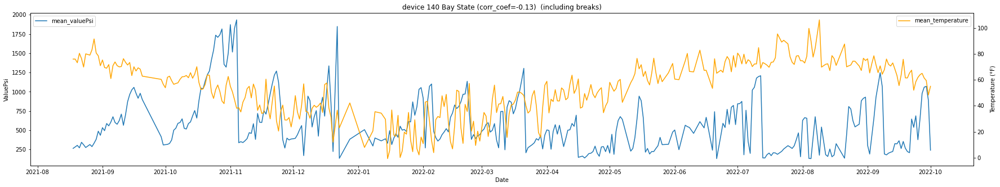

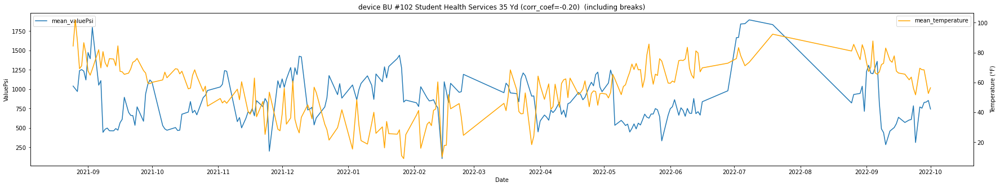

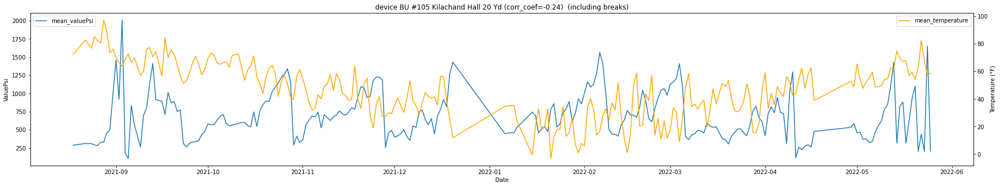

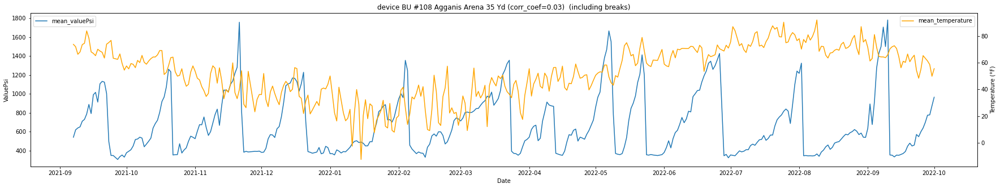

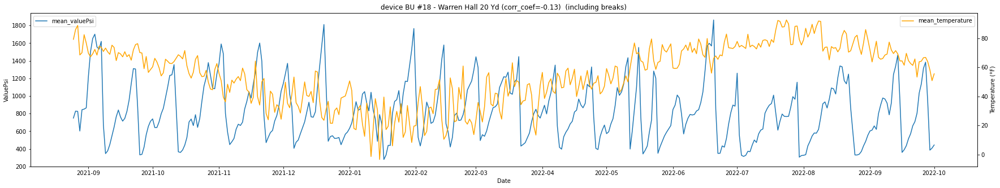

...

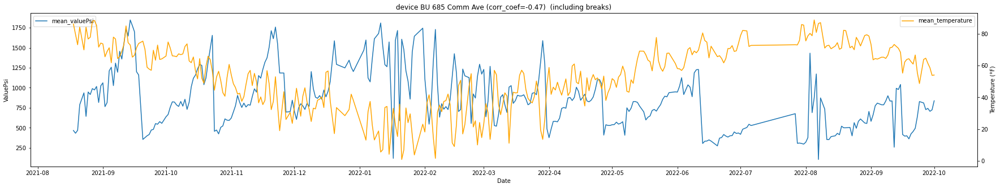

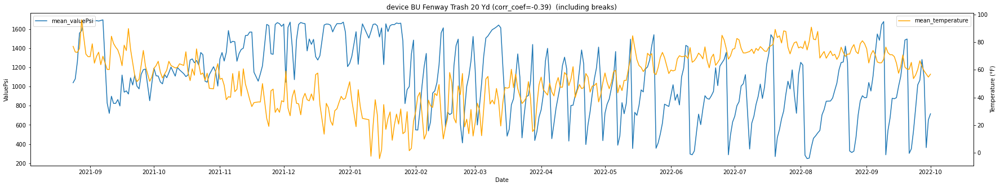

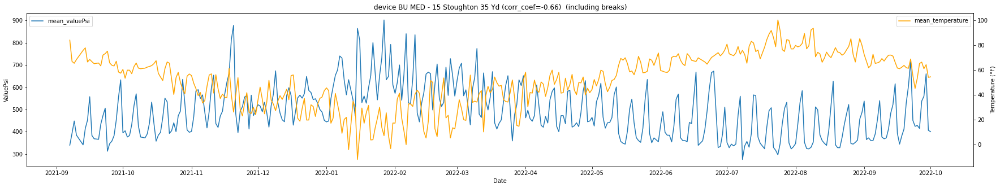

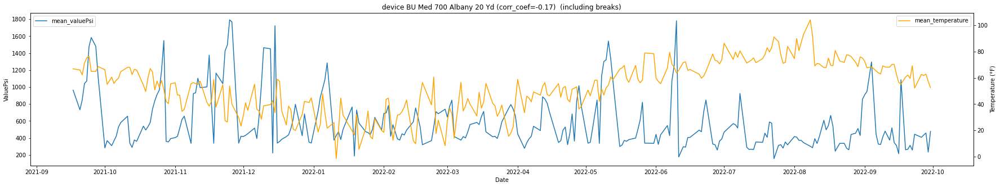

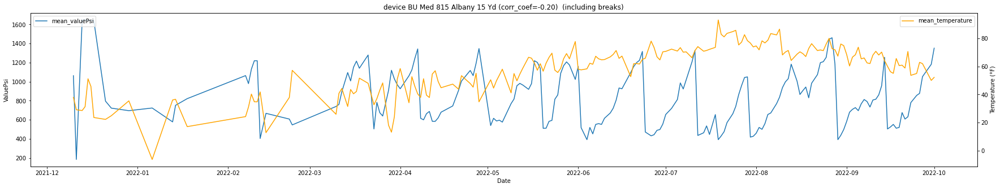

In [58]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.dates as mdates
from scipy.stats import pearsonr

# Set the directory path where the CSV files are stored
directory = sum_all

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Create a PDF file to save the plots
pdf_pages = PdfPages('lineChart_for_each_device_all_dates.pdf')

# Loop over each CSV file and plot it
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path, parse_dates=['date'], index_col='date')
    df = df.dropna()
    # Extract the five-digit device number from the file name
    device_number = file.split('_')[0]
    # Convert Celsius to Fahrenheit
    df['fahrenheit'] = df['mean_celsius'] * 1.8 + 32
    # Calculate the correlation coefficient between temperature and valuePsi
    corr_coef, _ = pearsonr(df['mean_fahrenheit'], df['mean_valuePsi'])
    # Create the plot
    fig, ax1 = plt.subplots(figsize=(30, 5))
    ax2 = ax1.twinx()
    ax1.plot(df.index, df['mean_valuePsi'], label='mean_valuePsi')
    ax2.plot(df.index, df['mean_fahrenheit'], label='mean_temperature', color='orange')
    ax1.set_title(f"device {device_number} (corr_coef={corr_coef:.2f})  (including breaks)")
    ax1.set_xlabel('Date')
    ax1.set_ylabel('ValuePsi')
    ax2.set_ylabel('Temperature (°F)')
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    # Save the plot to the PDF file
    pdf_pages.savefig()
    plt.show()
    plt.close()

# Close the PDF file
pdf_pages.close()


In [59]:
pip install prettytable

Note: you may need to restart the kernel to use updated packages.


In [97]:
import os
import pandas as pd
from scipy.stats import pearsonr
from prettytable import PrettyTable

# Set the directory path where the CSV files are stored
directory =  sum_all

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Read the building types CSV file into a pandas dataframe
df_building_types = pd.read_csv(device_loc)

# Create a dictionary to map device names to building types
device_to_building_type = dict(zip(df_building_types['Device'], df_building_types['Building Type']))

# Create the table
table = PrettyTable(['Device', 'Building Type', 'MeanF', 'MedianF', 'MaxF', 'MinF'])

# Loop over each CSV file and calculate the correlation coefficient between mean psi value and each fahrenheit value
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path)
    # Extract the device name from the file name
    device_name = file.split('_')[0]
    building_type = device_to_building_type.get(device_name, 'Unknown')
    row = [device_name, building_type]
    # Calculate the correlation coefficient between mean psi value and each fahrenheit value
    for col in ['mean_fahrenheit', 'median_fahrenheit', 'max_fahrenheit', 'min_fahrenheit']:
        corr_coef, _ = pearsonr(df[col], df['mean_valuePsi'])
        if corr_coef >= 0.1:
            color = '\033[31m'  # red
        elif corr_coef <= -0.1:
            color = '\033[34m'  # blue
        else:
            color = ''
        row.append(f'{color}{corr_coef:.2f}\033[0m')
    # Add the row to the table
    table.add_row(row)

# Add a title to the table
table.title = 'Correlation Coefficients Between Mean ValuePsi and Fahrenheit (All Dates)'

# Sort the table by building type
table.sortby = 'Building Type'

# Print the table
print(table)


+-----------------------------------------------------------------------------------------+
|        Correlation Coefficients Between Mean ValuePsi and Fahrenheit (All Dates)        |
+---------------------------------------+---------------+-------+---------+-------+-------+
|                 Device                | Building Type | MeanF | MedianF |  MaxF |  MinF |
+---------------------------------------+---------------+-------+---------+-------+-------+
|         BU #35 22 Babbit 35 Yd        |    Academic   | -0.02 |  -0.02  | -0.00 | -0.01 |
|       BU #38 Life Sciences 20 Yd      |    Academic   |  0.34 |   0.32  |  0.34 |  0.34 |
|      BU #72 Rafik B Hariri 20 YD      |    Academic   | -0.22 |  -0.22  | -0.19 | -0.22 |
|  BU #87 College of Engineering 20 Yd  |    Academic   | -0.19 |  -0.20  | -0.17 | -0.19 |
|       BU #90 - School of Law 35       |    Academic   | -0.23 |  -0.23  | -0.20 | -0.24 |
|       BU #96 808 Comm Ave 35 Yd       |    Academic   | -0.05 |  -0.07  | -0.0

In [90]:
import os
import pandas as pd
import folium

path = 'C:/Users/67246/Documents/GitHub/CS506Privatee/Project/Data/Processed/Device Geo Locations.csv'
# Read the CSV file into a pandas dataframe
df_locations = pd.read_csv(path)

# Set the directory path where the CSV files are stored
directory =  sum_all

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Create a map centered on the first device's location
map = folium.Map(location=[df_locations['Latitude'][0], df_locations['Longitude'][0]], zoom_start=13.5)

# Define the HTML template for the popup
popup_template = """
<div style="font-size: 16px;">
    <strong>Device Name:</strong> {device_name}<br>
    <strong>Site Name:</strong> {site_name}<br>
    <strong>Correlation Coefficient:</strong> {correlation:.2f}
</div>
"""

# Loop through each CSV file
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path)
    # Extract the device name from the file name
    device_name = file.split('_')[0]
    
    # Find the row in the dataframe with the matching device name
    device_row = df_locations.loc[df_locations['Device'] == device_name]
    
    # If there is a matching row, add a marker for the device to the map
    if not device_row.empty:
        site_name = device_row.iloc[0]['Site']
        
        # Calculate the correlation coefficient between mean psi value and mean fahrenheit value
        corr_coef, _ = pearsonr(df['mean_fahrenheit'], df['mean_valuePsi'])
        color = 'gray'  # Default color
        if corr_coef >= 0.2:
            color = 'red'
        elif corr_coef >= 0.1:
            color = 'lightred'
        elif corr_coef <= -0.2:
            color = 'blue'
        elif corr_coef <= -0.1:
            color = 'lightblue'
        
        # Add a marker for the device to the map with a popup showing device information
        popup_text = popup_template.format(device_name=device_name, site_name=site_name, correlation=corr_coef)
        folium.Marker(location=[device_row.iloc[0]['Latitude'], device_row.iloc[0]['Longitude']], 
                      popup=popup_text, icon=folium.Icon(color=color)).add_to(map)

# Save the map to an HTML file
map.save('device_map_all_days.html')
map

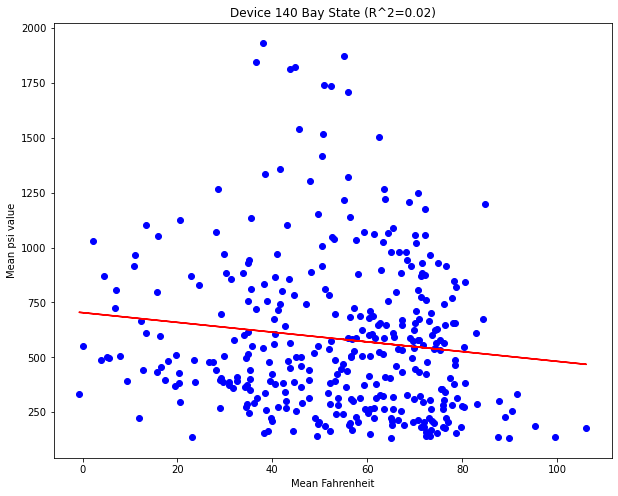

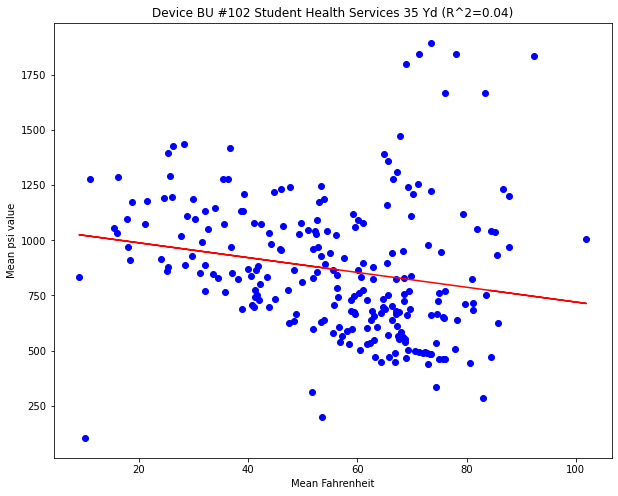

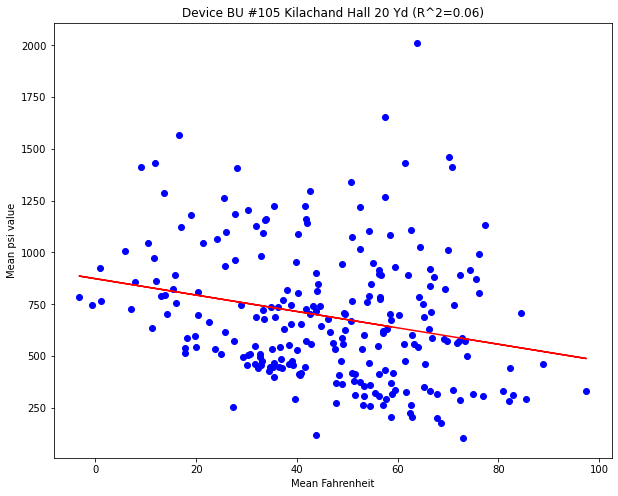

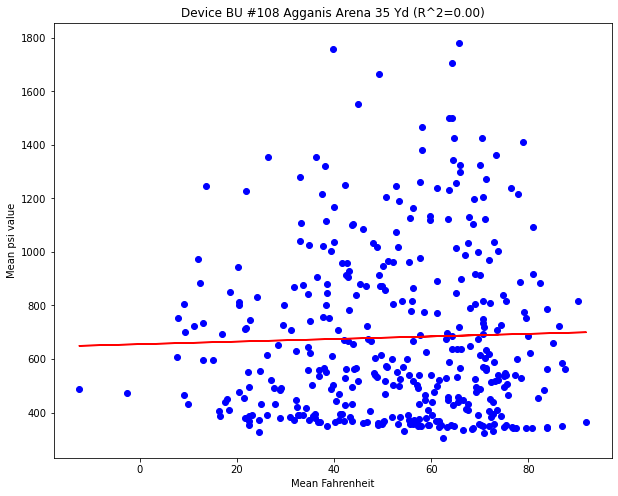

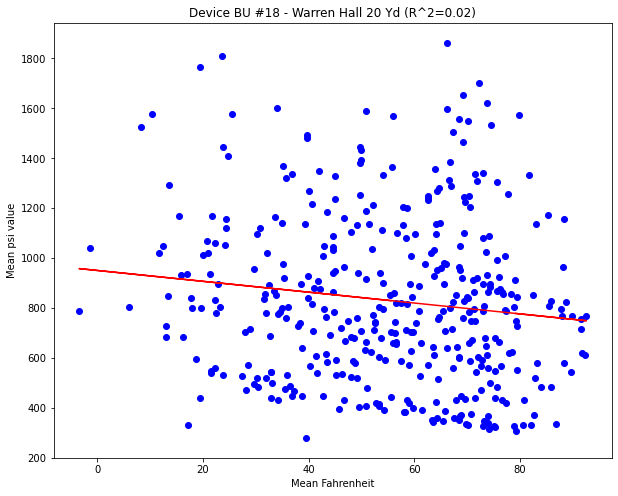

...

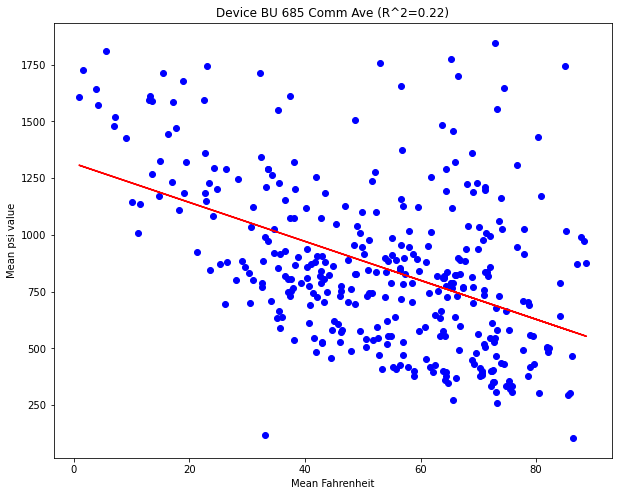

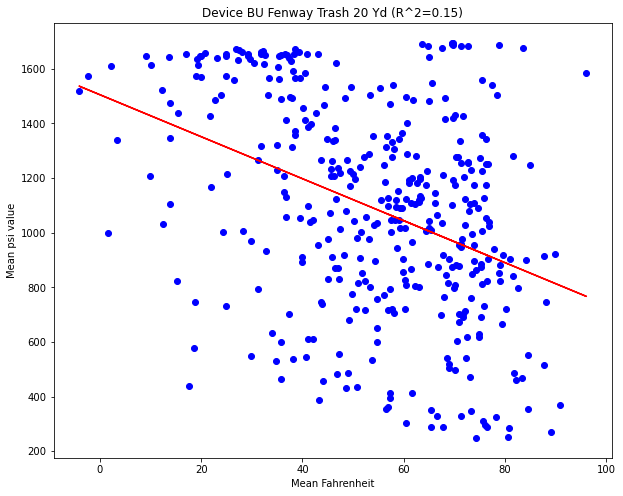

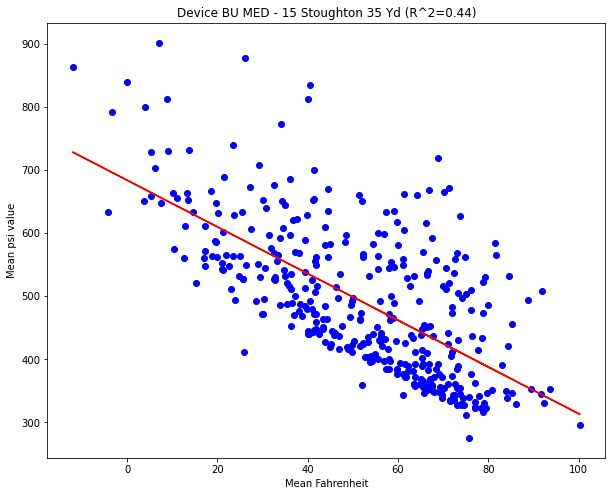

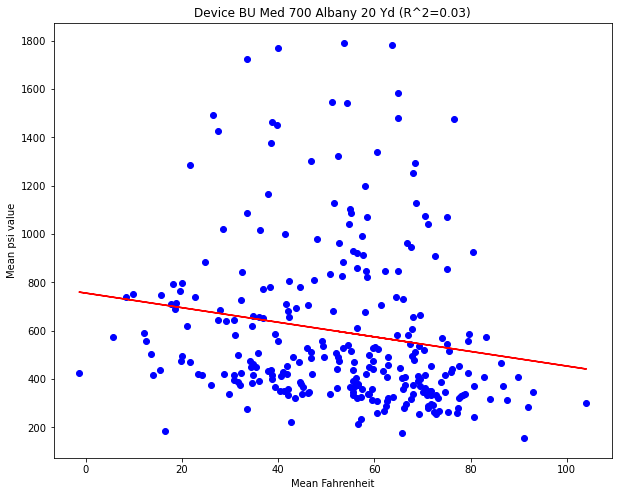

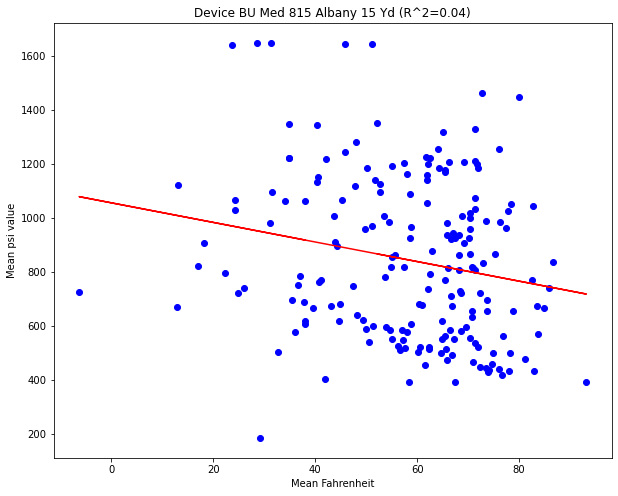

In [77]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.linear_model import LinearRegression

# Set the directory path where the CSV files are stored
directory = sum_all

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Create a PDF file to save the plots
pdf_pages = PdfPages('linear_regression_plots_all_days.pdf')

# Loop over each CSV file and plot the linear regression between mean psi value and mean fahrenheit value
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path)
    # Extract the device name from the file name
    device_name = file.split('_')[0]
    # Calculate the linear regression between mean psi value and mean fahrenheit value
    X = df['mean_fahrenheit'].values.reshape(-1, 1)
    y = df['mean_valuePsi'].values.reshape(-1, 1)
    model = LinearRegression().fit(X, y)
    r_sq = model.score(X, y)
    intercept = model.intercept_
    slope = model.coef_[0]
    # Plot the linear regression line
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.scatter(X, y, color='blue')
    ax.plot(X, intercept + slope * X, color='red')
    ax.set_title(f"Device {device_name} (R^2={r_sq:.2f})")
    ax.set_xlabel('Mean Fahrenheit')
    ax.set_ylabel('Mean psi value')
    pdf_pages.savefig()
    plt.show()
    plt.close()

# Close the PDF file
pdf_pages.close()


In [82]:

pip install folium


Note: you may need to restart the kernel to use updated packages.


R-squared (R²) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model. In other words, it's a measure of how well the regression line fits the data. R-squared values range from 0 to 1, with higher values indicating that more of the variance in the dependent variable is explained by the independent variable(s) in the model. A value of 1 indicates a perfect fit, where all of the variance in the dependent variable is explained by the independent variable(s), while a value of 0 indicates no relationship between the variables. 

**FOR Without Breaks**

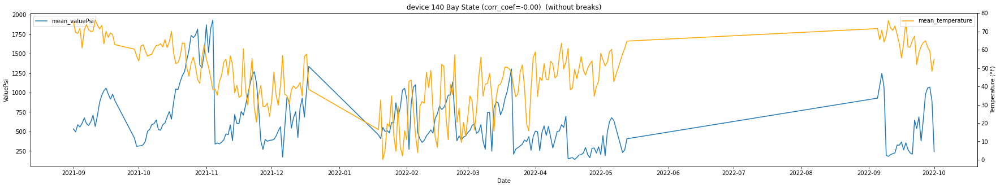

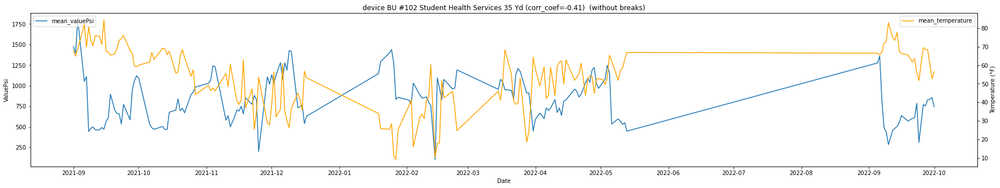

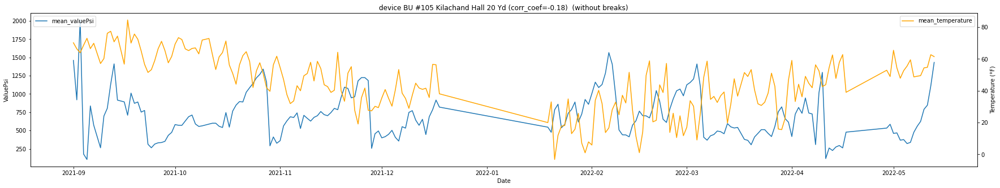

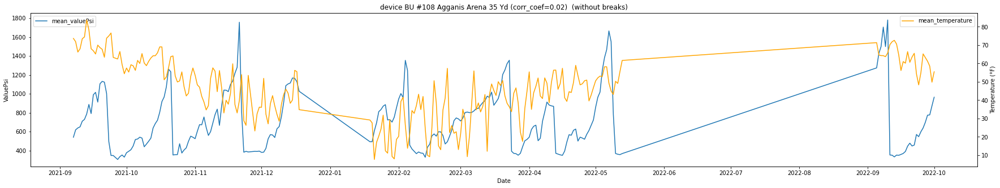

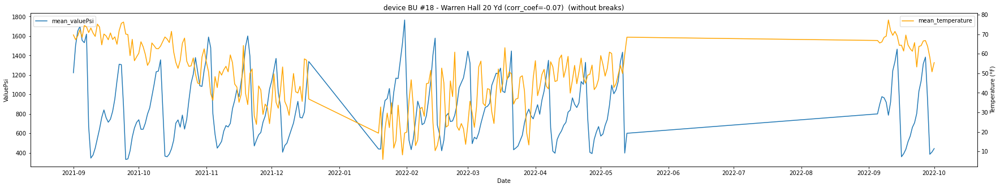

...

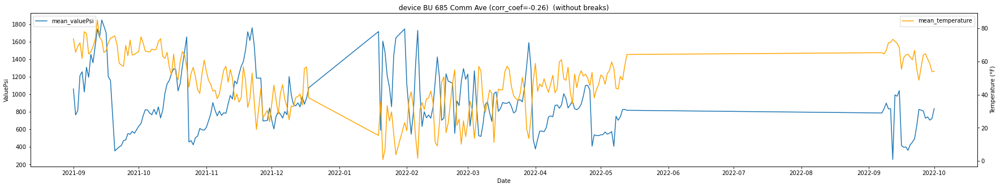

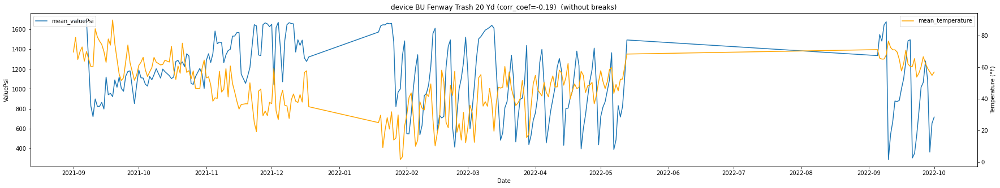

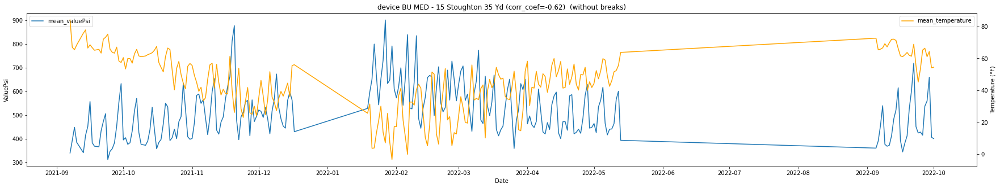

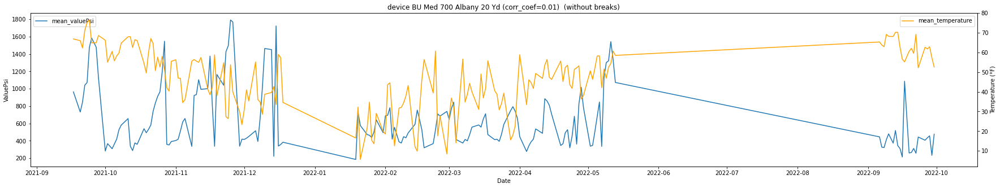

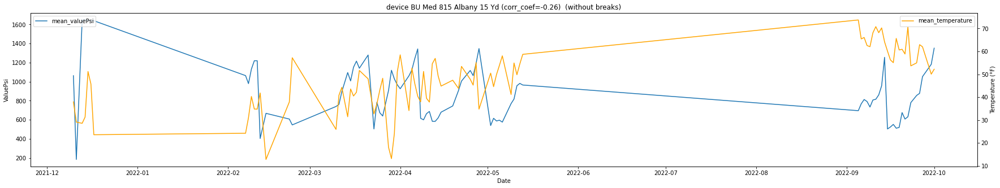

In [100]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.dates as mdates
from scipy.stats import pearsonr

# Set the directory path where the CSV files are stored
directory = sum_withoutB

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Create a PDF file to save the plots
pdf_pages = PdfPages('lineChart_for_each_device_without_breaks.pdf')

# Loop over each CSV file and plot it
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path, parse_dates=['date'], index_col='date')
    df = df.dropna()
    # Extract the five-digit device number from the file name
    device_number = file.split('_')[0]
    # Convert Celsius to Fahrenheit
    df['fahrenheit'] = df['mean_celsius'] * 1.8 + 32
    # Calculate the correlation coefficient between temperature and valuePsi
    corr_coef, _ = pearsonr(df['mean_fahrenheit'], df['mean_valuePsi'])
    # Create the plot
    fig, ax1 = plt.subplots(figsize=(30, 5))
    ax2 = ax1.twinx()
    ax1.plot(df.index, df['mean_valuePsi'], label='mean_valuePsi')
    ax2.plot(df.index, df['mean_fahrenheit'], label='mean_temperature', color='orange')
    ax1.set_title(f"device {device_number} (corr_coef={corr_coef:.2f})  (without breaks)")
    ax1.set_xlabel('Date')
    ax1.set_ylabel('ValuePsi')
    ax2.set_ylabel('Temperature (°F)')
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    # Save the plot to the PDF file
    pdf_pages.savefig()
    plt.show()
    plt.close()

# Close the PDF file
pdf_pages.close()


In [98]:
import os
import pandas as pd
from scipy.stats import pearsonr
from prettytable import PrettyTable

# Set the directory path where the CSV files are stored
directory =  sum_withoutB

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Read the building types CSV file into a pandas dataframe
df_building_types = pd.read_csv(device_loc)

# Create a dictionary to map device names to building types
device_to_building_type = dict(zip(df_building_types['Device'], df_building_types['Building Type']))

# Create the table
table = PrettyTable(['Device', 'Building Type', 'MeanF', 'MedianF', 'MaxF', 'MinF'])

# Loop over each CSV file and calculate the correlation coefficient between mean psi value and each fahrenheit value
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path)
    # Extract the device name from the file name
    device_name = file.split('_')[0]
    building_type = device_to_building_type.get(device_name, 'Unknown')
    row = [device_name, building_type]
    # Calculate the correlation coefficient between mean psi value and each fahrenheit value
    for col in ['mean_fahrenheit', 'median_fahrenheit', 'max_fahrenheit', 'min_fahrenheit']:
        corr_coef, _ = pearsonr(df[col], df['mean_valuePsi'])
        if corr_coef >= 0.1:
            color = '\033[31m'  # red
        elif corr_coef <= -0.1:
            color = '\033[34m'  # blue
        else:
            color = ''
        row.append(f'{color}{corr_coef:.2f}\033[0m')
    # Add the row to the table
    table.add_row(row)

# Add a title to the table
table.title = 'Correlation Coefficients Between Mean ValuePsi and Fahrenheit (Without Breaks)'

# Sort the table by building type
table.sortby = 'Building Type'

# Print the table
print(table)


+-----------------------------------------------------------------------------------------+
|      Correlation Coefficients Between Mean ValuePsi and Fahrenheit (Without Breaks)     |
+---------------------------------------+---------------+-------+---------+-------+-------+
|                 Device                | Building Type | MeanF | MedianF |  MaxF |  MinF |
+---------------------------------------+---------------+-------+---------+-------+-------+
|         BU #35 22 Babbit 35 Yd        |    Academic   |  0.13 |   0.13  |  0.14 |  0.12 |
|       BU #38 Life Sciences 20 Yd      |    Academic   |  0.29 |   0.24  |  0.29 |  0.30 |
|      BU #72 Rafik B Hariri 20 YD      |    Academic   |  0.05 |   0.04  |  0.08 |  0.06 |
|  BU #87 College of Engineering 20 Yd  |    Academic   | -0.11 |  -0.12  | -0.09 | -0.08 |
|       BU #90 - School of Law 35       |    Academic   | -0.12 |  -0.13  | -0.10 | -0.12 |
|       BU #96 808 Comm Ave 35 Yd       |    Academic   | -0.12 |  -0.14  | -0.1

In [91]:
import os
import pandas as pd
import folium

path = 'C:/Users/67246/Documents/GitHub/CS506Privatee/Project/Data/Processed/Device Geo Locations.csv'
# Read the CSV file into a pandas dataframe
df_locations = pd.read_csv(path)

# Set the directory path where the CSV files are stored
directory =  sum_withoutB

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Create a map centered on the first device's location
map = folium.Map(location=[df_locations['Latitude'][0], df_locations['Longitude'][0]], zoom_start=13.5)

# Define the HTML template for the popup
popup_template = """
<div style="font-size: 16px;">
    <strong>Device Name:</strong> {device_name}<br>
    <strong>Site Name:</strong> {site_name}<br>
    <strong>Correlation Coefficient:</strong> {correlation:.2f}
</div>
"""

# Loop through each CSV file
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path)
    # Extract the device name from the file name
    device_name = file.split('_')[0]
    
    # Find the row in the dataframe with the matching device name
    device_row = df_locations.loc[df_locations['Device'] == device_name]
    
    # If there is a matching row, add a marker for the device to the map
    if not device_row.empty:
        site_name = device_row.iloc[0]['Site']
        
        # Calculate the correlation coefficient between mean psi value and mean fahrenheit value
        corr_coef, _ = pearsonr(df['mean_fahrenheit'], df['mean_valuePsi'])
        color = 'gray'  # Default color
        if corr_coef >= 0.2:
            color = 'red'
        elif corr_coef >= 0.1:
            color = 'lightred'
        elif corr_coef <= -0.2:
            color = 'blue'
        elif corr_coef <= -0.1:
            color = 'lightblue'
        
        # Add a marker for the device to the map with a popup showing device information
        popup_text = popup_template.format(device_name=device_name, site_name=site_name, correlation=corr_coef)
        folium.Marker(location=[device_row.iloc[0]['Latitude'], device_row.iloc[0]['Longitude']], 
                      popup=popup_text, icon=folium.Icon(color=color)).add_to(map)

# Save the map to an HTML file
map.save('device_map_without_breaks.html')
map

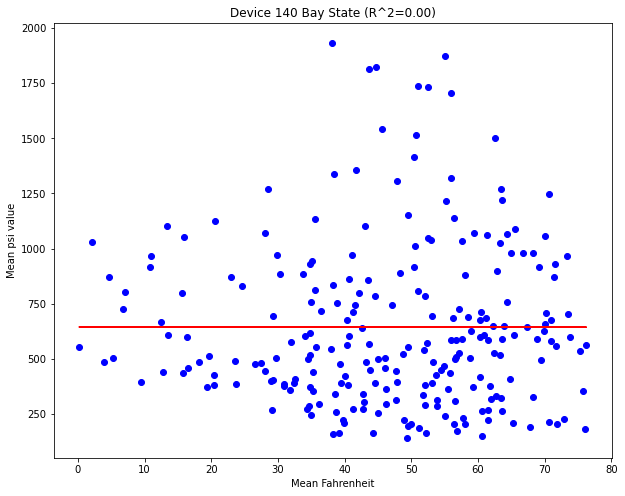

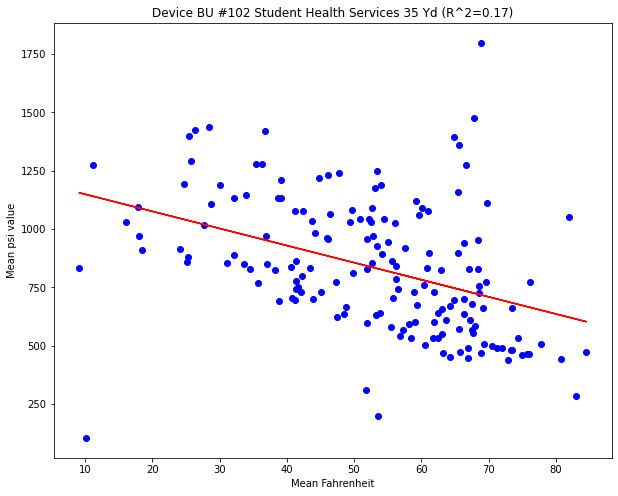

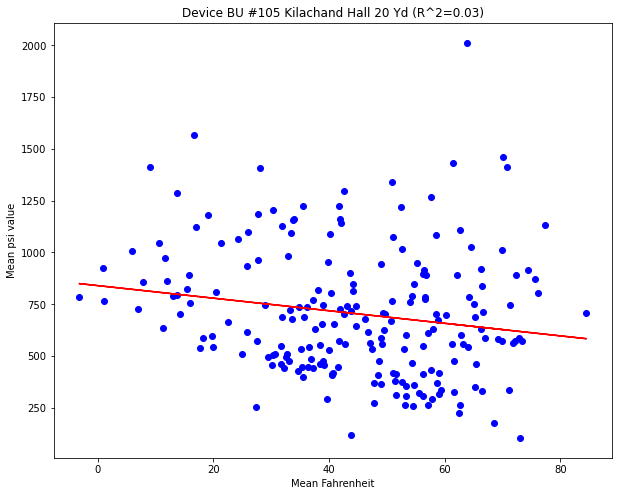

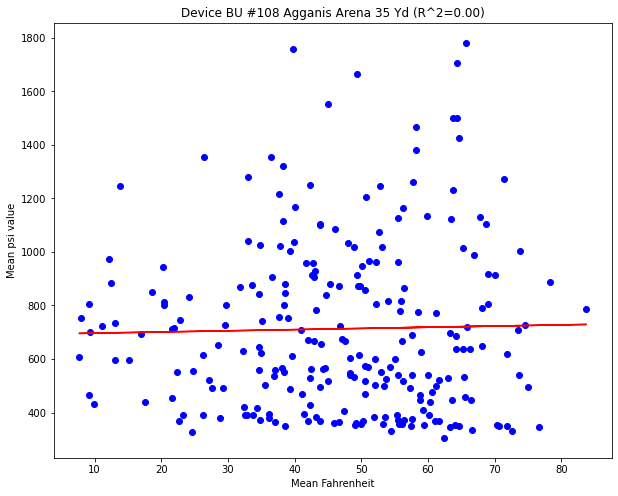

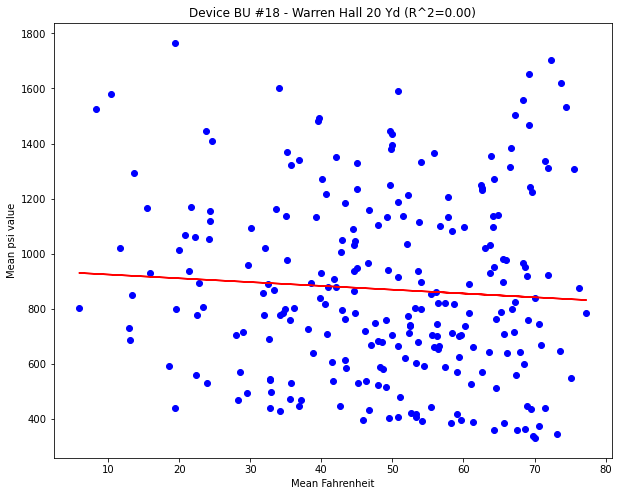

...

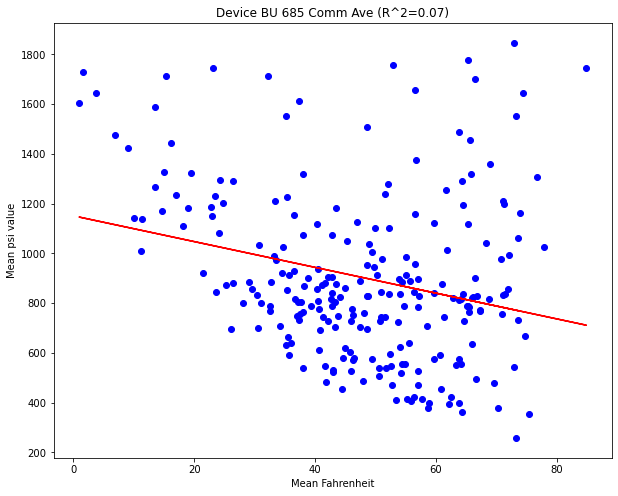

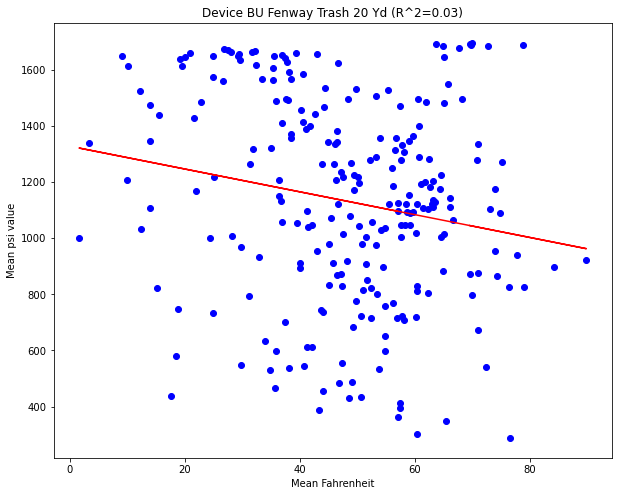

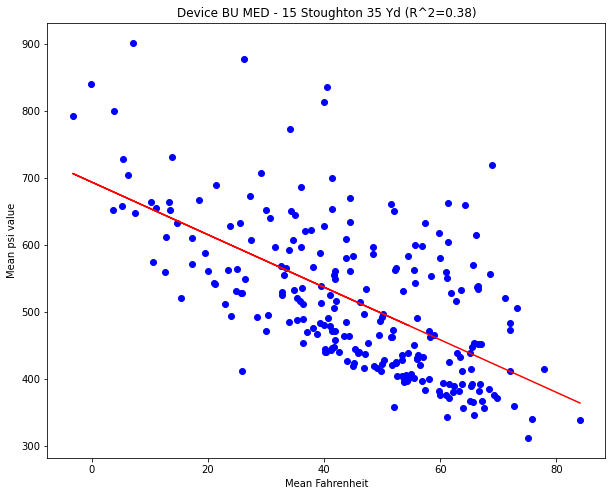

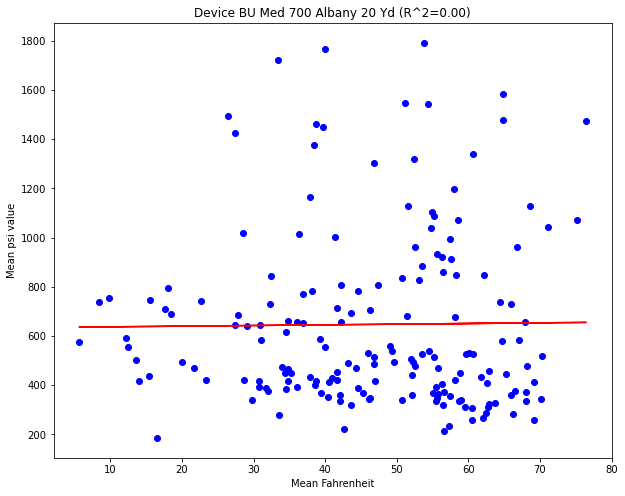

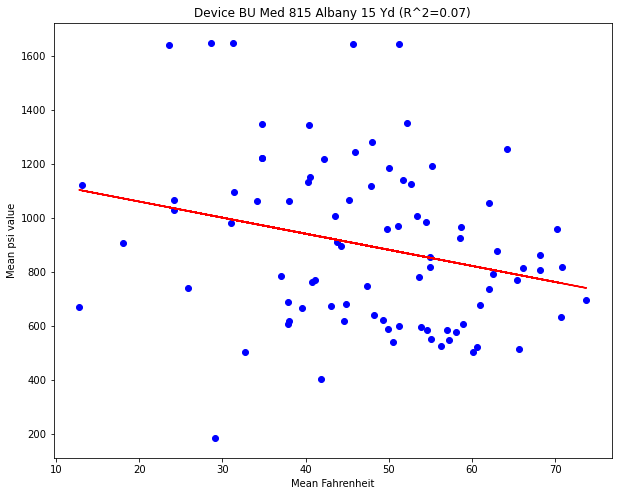

In [68]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.linear_model import LinearRegression

# Set the directory path where the CSV files are stored
directory = sum_withoutB

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Create a PDF file to save the plots
pdf_pages = PdfPages('linear_regression_plots_without_breaks.pdf')

# Loop over each CSV file and plot the linear regression between mean psi value and mean fahrenheit value
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path)
    # Extract the device name from the file name
    device_name = file.split('_')[0]
    # Calculate the linear regression between mean psi value and mean fahrenheit value
    X = df['mean_fahrenheit'].values.reshape(-1, 1)
    y = df['mean_valuePsi'].values.reshape(-1, 1)
    model = LinearRegression().fit(X, y)
    r_sq = model.score(X, y)
    intercept = model.intercept_
    slope = model.coef_[0]
    # Plot the linear regression line
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.scatter(X, y, color='blue')
    ax.plot(X, intercept + slope * X, color='red')
    ax.set_title(f"Device {device_name} (R^2={r_sq:.2f})")
    ax.set_xlabel('Mean Fahrenheit')
    ax.set_ylabel('Mean psi value')
    pdf_pages.savefig()
    plt.show()
    plt.close()

# Close the PDF file
pdf_pages.close()


**For only breaks**

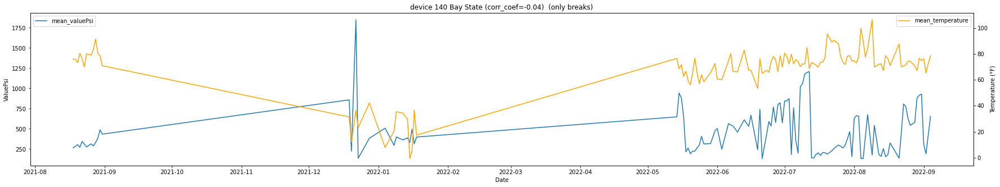

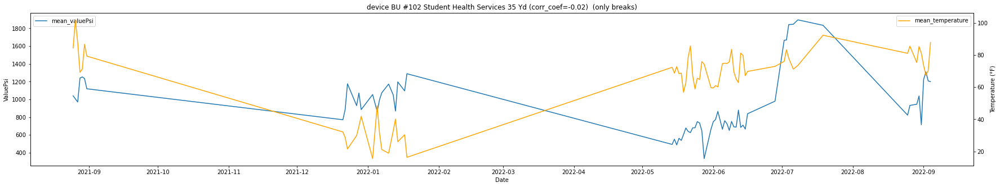

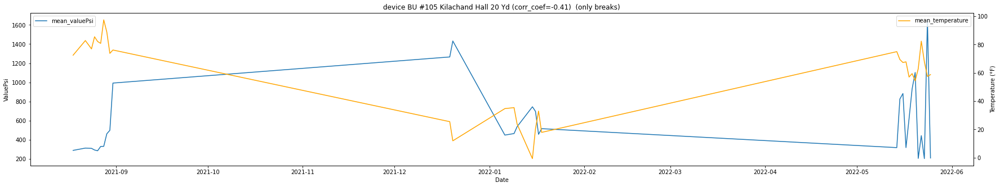

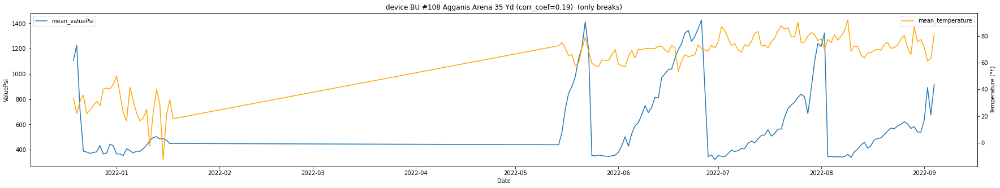

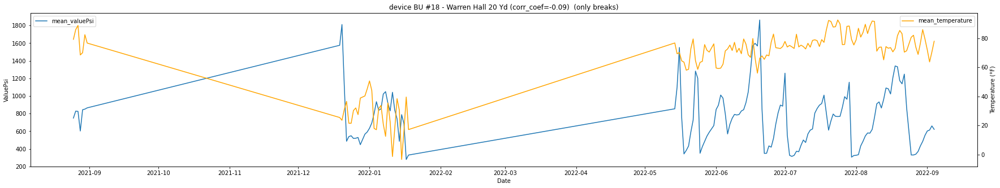

...

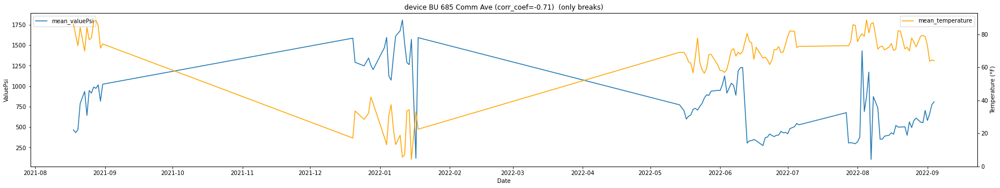

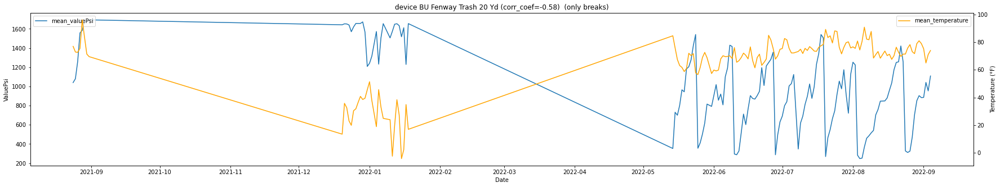

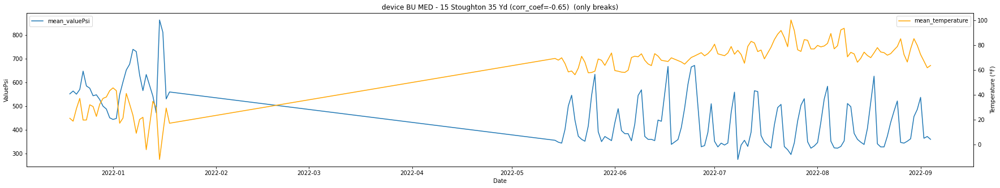

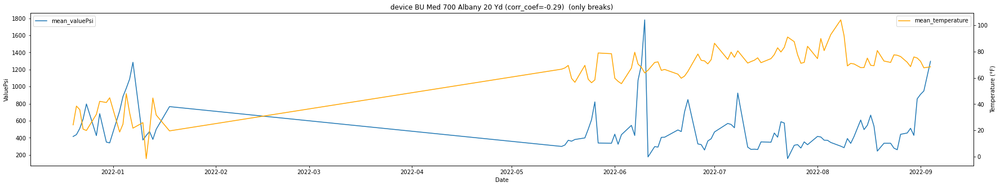

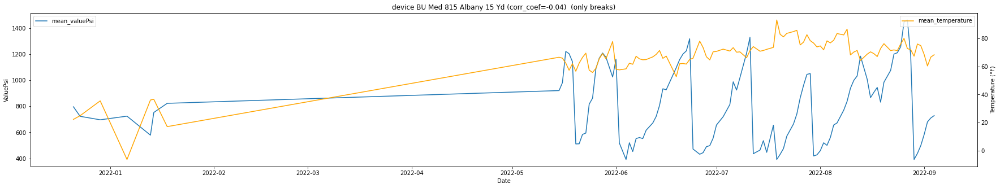

In [101]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.dates as mdates
from scipy.stats import pearsonr

# Set the directory path where the CSV files are stored
directory = sum_OnlyB

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Create a PDF file to save the plots
pdf_pages = PdfPages('lineChart_for_each_device_only_breaks.pdf')

# Loop over each CSV file and plot it
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path, parse_dates=['date'], index_col='date')
    df = df.dropna()
    # Extract the five-digit device number from the file name
    device_number = file.split('_')[0]
    # Convert Celsius to Fahrenheit
    df['fahrenheit'] = df['mean_celsius'] * 1.8 + 32
    # Calculate the correlation coefficient between temperature and valuePsi
    corr_coef, _ = pearsonr(df['mean_fahrenheit'], df['mean_valuePsi'])
    # Create the plot
    fig, ax1 = plt.subplots(figsize=(30, 5))
    ax2 = ax1.twinx()
    ax1.plot(df.index, df['mean_valuePsi'], label='mean_valuePsi')
    ax2.plot(df.index, df['mean_fahrenheit'], label='mean_temperature', color='orange')
    ax1.set_title(f"device {device_number} (corr_coef={corr_coef:.2f})  (only breaks)")
    ax1.set_xlabel('Date')
    ax1.set_ylabel('ValuePsi')
    ax2.set_ylabel('Temperature (°F)')
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    # Save the plot to the PDF file
    pdf_pages.savefig()
    plt.show()
    plt.close()

# Close the PDF file
pdf_pages.close()


In [99]:
import os
import pandas as pd
from scipy.stats import pearsonr
from prettytable import PrettyTable

# Set the directory path where the CSV files are stored
directory =  sum_OnlyB

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Read the building types CSV file into a pandas dataframe
df_building_types = pd.read_csv(device_loc)

# Create a dictionary to map device names to building types
device_to_building_type = dict(zip(df_building_types['Device'], df_building_types['Building Type']))

# Create the table
table = PrettyTable(['Device', 'Building Type', 'MeanF', 'MedianF', 'MaxF', 'MinF'])

# Loop over each CSV file and calculate the correlation coefficient between mean psi value and each fahrenheit value
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path)
    # Extract the device name from the file name
    device_name = file.split('_')[0]
    building_type = device_to_building_type.get(device_name, 'Unknown')
    row = [device_name, building_type]
    # Calculate the correlation coefficient between mean psi value and each fahrenheit value
    for col in ['mean_fahrenheit', 'median_fahrenheit', 'max_fahrenheit', 'min_fahrenheit']:
        corr_coef, _ = pearsonr(df[col], df['mean_valuePsi'])
        if corr_coef >= 0.1:
            color = '\033[31m'  # red
        elif corr_coef <= -0.1:
            color = '\033[34m'  # blue
        else:
            color = ''
        row.append(f'{color}{corr_coef:.2f}\033[0m')
    # Add the row to the table
    table.add_row(row)

# Add a title to the table
table.title = 'Correlation Coefficients Between Mean ValuePsi and Fahrenheit (Only Breaks)'

# Sort the table by building type
table.sortby = 'Building Type'

# Print the table
print(table)


+-----------------------------------------------------------------------------------------+
|       Correlation Coefficients Between Mean ValuePsi and Fahrenheit (Only Breaks)       |
+---------------------------------------+---------------+-------+---------+-------+-------+
|                 Device                | Building Type | MeanF | MedianF |  MaxF |  MinF |
+---------------------------------------+---------------+-------+---------+-------+-------+
|         BU #35 22 Babbit 35 Yd        |    Academic   | -0.22 |  -0.23  | -0.19 | -0.23 |
|       BU #38 Life Sciences 20 Yd      |    Academic   |  0.28 |   0.29  |  0.28 |  0.26 |
|      BU #72 Rafik B Hariri 20 YD      |    Academic   | -0.55 |  -0.55  | -0.52 | -0.55 |
|  BU #87 College of Engineering 20 Yd  |    Academic   | -0.19 |  -0.18  | -0.15 | -0.23 |
|       BU #90 - School of Law 35       |    Academic   | -0.30 |  -0.30  | -0.28 | -0.35 |
|       BU #96 808 Comm Ave 35 Yd       |    Academic   | -0.06 |  -0.06  | -0.0

In [92]:
import os
import pandas as pd
import folium

path = 'C:/Users/67246/Documents/GitHub/CS506Privatee/Project/Data/Processed/Device Geo Locations.csv'
# Read the CSV file into a pandas dataframe
df_locations = pd.read_csv(path)

# Set the directory path where the CSV files are stored
directory =  sum_OnlyB

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Create a map centered on the first device's location
map = folium.Map(location=[df_locations['Latitude'][0], df_locations['Longitude'][0]], zoom_start=13.5)

# Define the HTML template for the popup
popup_template = """
<div style="font-size: 16px;">
    <strong>Device Name:</strong> {device_name}<br>
    <strong>Site Name:</strong> {site_name}<br>
    <strong>Correlation Coefficient:</strong> {correlation:.2f}
</div>
"""

# Loop through each CSV file
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path)
    # Extract the device name from the file name
    device_name = file.split('_')[0]
    
    # Find the row in the dataframe with the matching device name
    device_row = df_locations.loc[df_locations['Device'] == device_name]
    
    # If there is a matching row, add a marker for the device to the map
    if not device_row.empty:
        site_name = device_row.iloc[0]['Site']
        
        # Calculate the correlation coefficient between mean psi value and mean fahrenheit value
        corr_coef, _ = pearsonr(df['mean_fahrenheit'], df['mean_valuePsi'])
        color = 'gray'  # Default color
        if corr_coef >= 0.2:
            color = 'red'
        elif corr_coef >= 0.1:
            color = 'lightred'
        elif corr_coef <= -0.2:
            color = 'blue'
        elif corr_coef <= -0.1:
            color = 'lightblue'
        
        # Add a marker for the device to the map with a popup showing device information
        popup_text = popup_template.format(device_name=device_name, site_name=site_name, correlation=corr_coef)
        folium.Marker(location=[device_row.iloc[0]['Latitude'], device_row.iloc[0]['Longitude']], 
                      popup=popup_text, icon=folium.Icon(color=color)).add_to(map)

# Save the map to an HTML file
map.save('device_map_only_breaks.html')
map

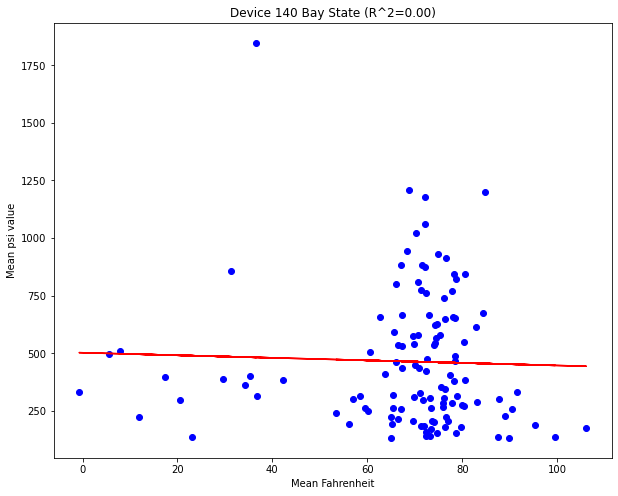

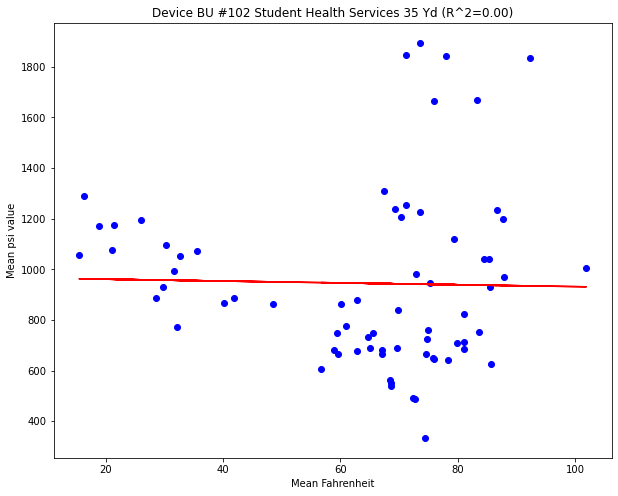

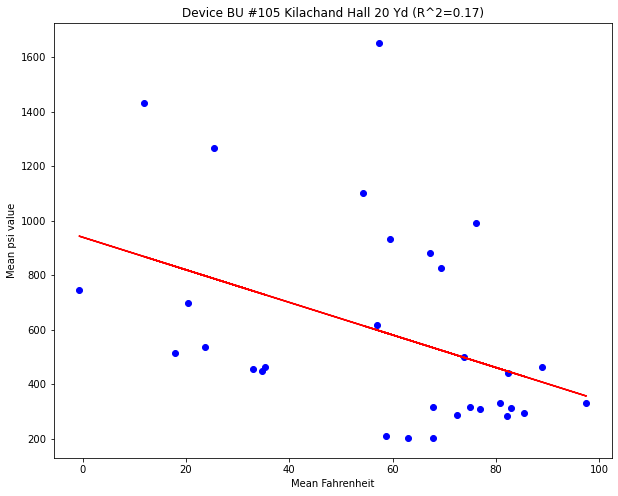

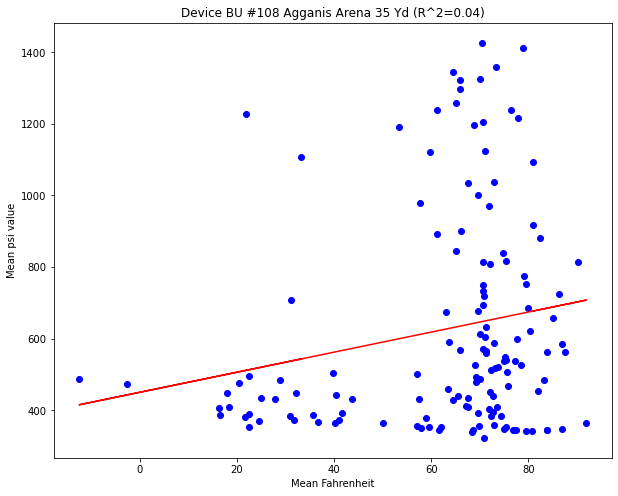

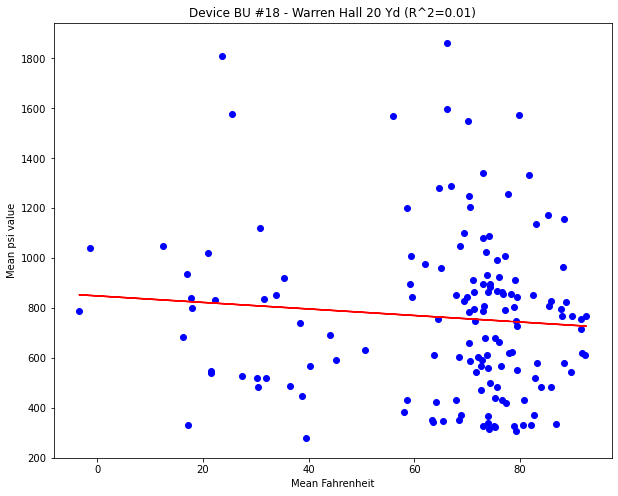

...

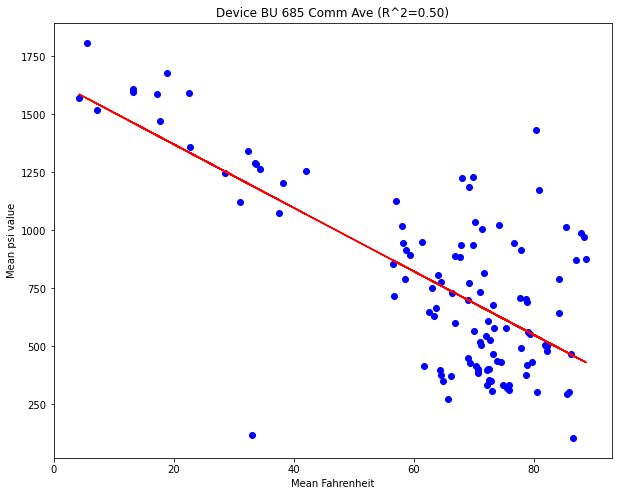

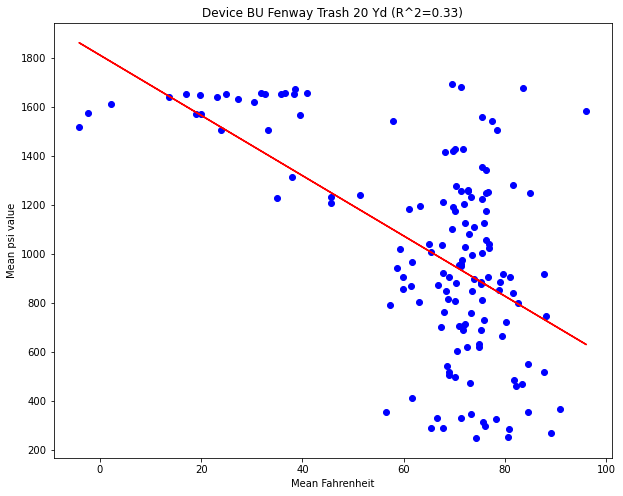

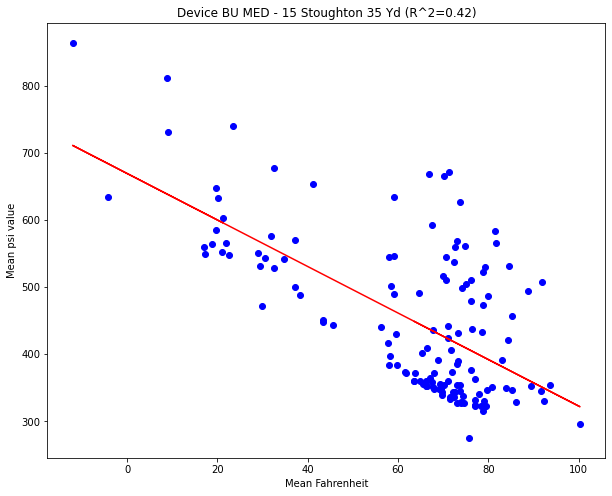

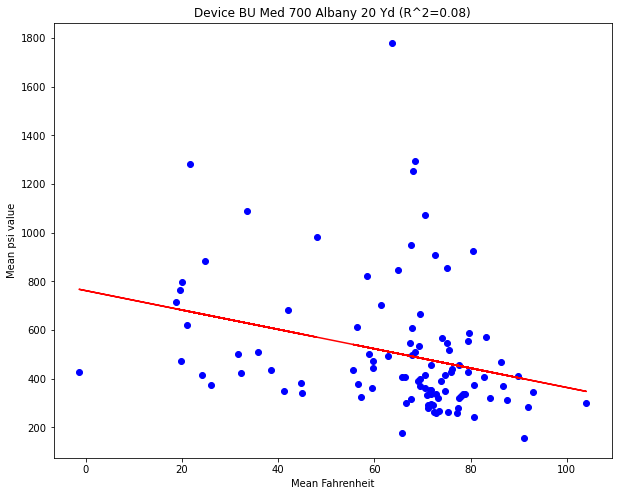

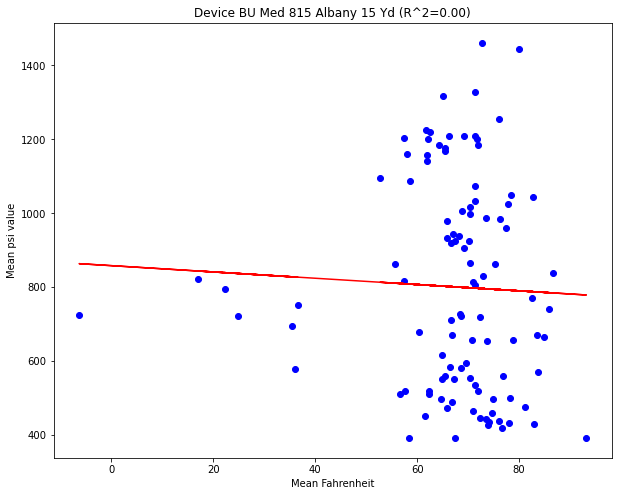

In [71]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.linear_model import LinearRegression

# Set the directory path where the CSV files are stored
directory = sum_OnlyB

# List all the CSV files in the directory and sort them by file name
csv_files = sorted([file for file in os.listdir(directory) if file.endswith('.csv')])

# Create a PDF file to save the plots
pdf_pages = PdfPages('linear_regression_plots_only_breaks.pdf')

# Loop over each CSV file and plot the linear regression between mean psi value and mean fahrenheit value
for file in csv_files:
    file_path = os.path.join(directory, file)
    df = pd.read_csv(file_path)
    # Extract the device name from the file name
    device_name = file.split('_')[0]
    # Calculate the linear regression between mean psi value and mean fahrenheit value
    X = df['mean_fahrenheit'].values.reshape(-1, 1)
    y = df['mean_valuePsi'].values.reshape(-1, 1)
    model = LinearRegression().fit(X, y)
    r_sq = model.score(X, y)
    intercept = model.intercept_
    slope = model.coef_[0]
    # Plot the linear regression line
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.scatter(X, y, color='blue')
    ax.plot(X, intercept + slope * X, color='red')
    ax.set_title(f"Device {device_name} (R^2={r_sq:.2f})")
    ax.set_xlabel('Mean Fahrenheit')
    ax.set_ylabel('Mean psi value')
    pdf_pages.savefig()
    plt.show()
    plt.close()

# Close the PDF file
pdf_pages.close()
